In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
seed=42

In [3]:
from fastai import *
from fastai.vision import *
from fastai.callbacks.hooks import *
import scipy.ndimage

import gc

np.random.seed(seed)

PATH = Path('data_draw')

# reset learner
def reset_learner(data,is_fp16=False):
    learn=None
    gc.collect()
    learn = create_cnn(data, models.resnet50, metrics=accuracy)
    if is_fp16:
        learn = learn.to_fp16()
    return learn
def get_data(bs,size,tfms,path=PATH,seed=seed):
    np.random.seed(seed)
#     tfms = get_transforms(do_flip=True, max_rotate=5, max_zoom=1, max_lighting=0.2, max_warp=0,p_affine=0,p_lighting=0.75)
    return ImageDataBunch.from_folder(path,train='train',valid='valid',bs=bs,ds_tfms = tfms,size=size,num_workers=4).normalize(imagenet_stats)



In [1]:
from gradcam import *

# Test fp16 speed

In [7]:
data=None
gc.collect()

tfms = get_transforms()
data = get_data(40,300,tfms)
learn= reset_learner(data,is_fp16=False)

In [8]:
learn.freeze()
learn.fit_one_cycle(1,max_lr=8e-03)

epoch,train_loss,valid_loss,accuracy
1,0.328636,0.333513,0.888889


In [5]:
data=None
gc.collect()

tfms = get_transforms()
data = get_data(78,300,tfms)
learn= reset_learner(data,is_fp16=True)

learn.freeze()
learn.fit_one_cycle(1,max_lr=8e-03)

epoch,train_loss,valid_loss,accuracy
1,0.306969,0.317931,0.889660


# Start training

In [ ]:
# best transformation so far
# tfms = get_transforms(do_flip=True, 
#                       max_rotate=5, 
#                       max_zoom=1.05, 
#                       max_lighting=0.3, 
#                       max_warp=0,
#                       p_affine=0.75,
#                       p_lighting=0.8)

In [6]:
# default
data=None
gc.collect()

tfms = get_transforms()
data = get_data(78,300,tfms)
learn= reset_learner(data,is_fp16=True)

In [11]:
# learn.freeze()
# learn.fit_one_cycle(5,max_lr=8e-03)

epoch,train_loss,valid_loss,accuracy
1,0.554953,0.682908,0.776235
2,0.409051,0.593808,0.820988
3,0.302915,0.474246,0.866512
4,0.159610,0.342816,0.901235
5,0.114809,0.281332,0.922840


In [12]:
# learn.save('stage1-300-new-5epochs');

In [8]:
learn.freeze()
learn.fit_one_cycle(8,max_lr=8e-03)

epoch,train_loss,valid_loss,accuracy
1,0.450493,0.557994,0.814815
2,0.458133,1.170629,0.655093
3,0.352317,0.697493,0.780093
4,0.280568,0.435559,0.865741
5,0.189970,0.375733,0.906636
6,0.127665,0.310947,0.924383
7,0.084757,0.265952,0.933642
8,0.063931,0.274629,0.928241


In [9]:
# learn.save('stage1-300-new-8epochs');

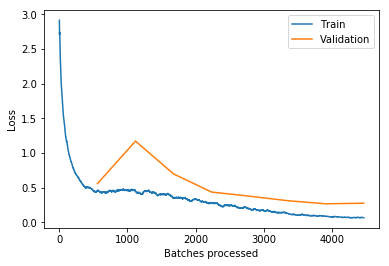

In [10]:
learn.recorder.plot_losses()

## stage 2

In [11]:
tfms = get_transforms()
data=None
gc.collect()
data = get_data(64,300,tfms)
learn= reset_learner(data,is_fp16=True)

In [12]:
learn.load('stage1-300-new-8epochs');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


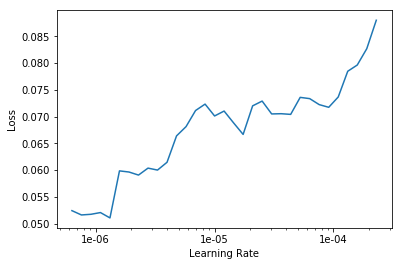

In [14]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


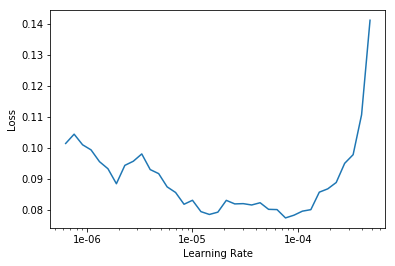

In [17]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


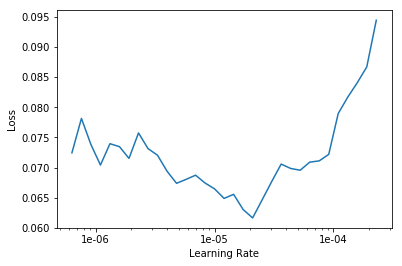

In [16]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [18]:
old_lr = 8e-03
learn.unfreeze()
learn.fit_one_cycle(5,max_lr=slice(8e-06,old_lr/5))

epoch,train_loss,valid_loss,accuracy
1,0.185940,0.467065,0.881944
2,0.164040,0.402223,0.895833
3,0.098417,0.324424,0.915123
4,0.051333,0.250662,0.933642
5,0.034788,0.235029,0.936728


In [19]:
# learn.save(f'stage2-300-new-5epochs');

# Increase img size

## stage 1

In [6]:
# default
data=None
gc.collect()

tfms = get_transforms()
data = get_data(60,350,tfms)
learn= reset_learner(data,is_fp16=True)

In [7]:
learn.load('stage2-300-new-5epochs');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


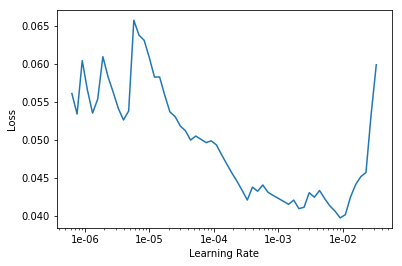

In [8]:
learn.freeze()
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


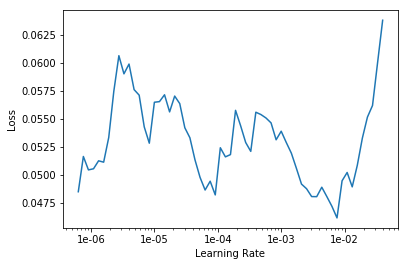

In [9]:
learn.freeze()
learn.lr_find()
learn.recorder.plot()

In [8]:
# NO. LR still TOO SMALL thus can't escape local optima
# learn.load('stage2-300-new-5epochs');
# learn.freeze()
# learn.fit_one_cycle(5,max_lr=1e-04)
# learn.save('stage1-350-new-5epochs-104');

epoch,train_loss,valid_loss,accuracy
1,0.048261,0.293340,0.929012
2,0.034394,0.273127,0.932099
3,0.036134,0.283905,0.932870
4,0.035614,0.279682,0.940586
5,0.032883,0.268851,0.935957


In [10]:
# learn.load('stage2-300-new-5epochs');
# learn.freeze()
# learn.fit_one_cycle(5,max_lr=3e-03)
# learn.save('stage1-350-new-5epochs-805');

epoch,train_loss,valid_loss,accuracy
1,0.055707,0.299787,0.935957
2,0.072910,0.294110,0.932870
3,0.056912,0.255739,0.946759
4,0.034302,0.270221,0.941358
5,0.029367,0.265141,0.940586


In [12]:
# learn.load('stage2-300-new-5epochs');
# learn.freeze()
# learn.fit_one_cycle(8,max_lr=3e-03)
# learn.save('stage1-350-new-8epochs-303');

epoch,train_loss,valid_loss,accuracy
1,0.035304,0.296222,0.932870
2,0.068448,0.275781,0.932870
3,0.071370,0.333685,0.927469
4,0.057781,0.340408,0.917438
5,0.044235,0.289150,0.930556
6,0.037936,0.255236,0.934414
7,0.026991,0.241586,0.942130
8,0.025183,0.251084,0.941358


## stage 2

In [20]:
data=None
gc.collect()

tfms = get_transforms()
data = get_data(52,350,tfms)
learn= reset_learner(data,is_fp16=True)

In [21]:
learn.load('stage1-350-new-8epochs-303');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


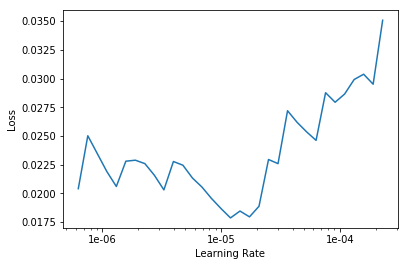

In [16]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


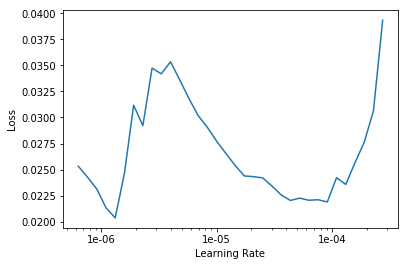

In [19]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


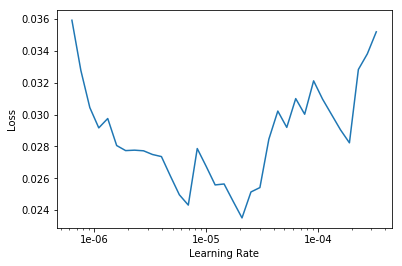

In [22]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [25]:
# learn.load('stage1-350-new-8epochs-303');
# old_lr = 3e-03
# learn.unfreeze()
# learn.fit_one_cycle(2,max_lr=slice(3e-05,old_lr/5))

epoch,train_loss,valid_loss,accuracy
1,0.133020,0.363225,0.907407
2,0.048032,0.219395,0.943673


In [26]:
# learn.save('stage2-350-new-2epochs-305');

In [39]:
learn.load('stage2-350-new-2epochs-305');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


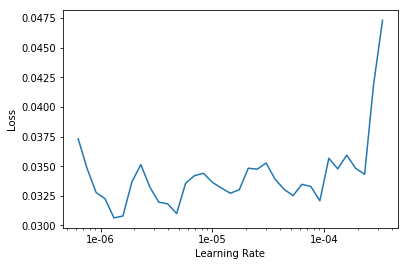

In [31]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


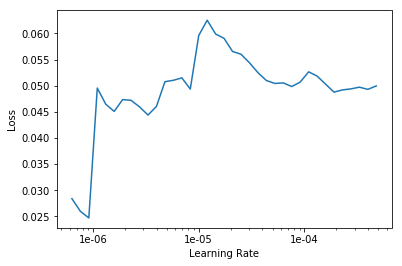

In [32]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


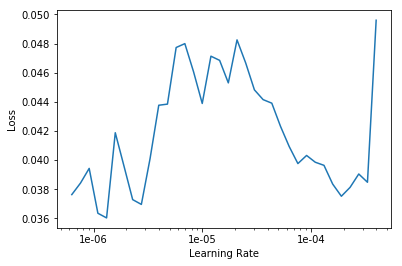

In [34]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [40]:

# learn.load('stage2-350-new-2epochs-305');
# learn.unfreeze()
# learn.fit_one_cycle(4,max_lr=slice(9e-07,3e-06))

epoch,train_loss,valid_loss,accuracy
1,0.043117,0.209942,0.942901
2,0.031498,0.211270,0.945988
3,0.033780,0.203016,0.943673
4,0.030303,0.209731,0.945216


In [41]:
# learn.save('stage2-350-new-2-4epochs-907306');

# Interpretation (on val set)

In [5]:
def class2idx(clas):
    return data.classes.index(clas)


## After stage 1 of progressive size increase

In [84]:
tfms = get_transforms()
data=None
gc.collect()
data = get_data(60,350,tfms)
learn= reset_learner(data)
learn.load('stage1-350-new-8epochs-303');

In [85]:
# learn.data.valid_dl.add_tfm(to_half)

interp = ClassificationInterpretation.from_learner(learn)

interp.most_confused()

[('castle', 'kiki', 8),
 ('beauty', 'tarzan', 6),
 ('hercules', 'mulan', 6),
 ('mulan', 'beauty', 6),
 ('beauty', 'mermaid', 4),
 ('hercules', 'beauty', 4),
 ('howl', 'tarzan', 4),
 ('beauty', 'hercules', 3),
 ('mononoke', 'kiki', 3),
 ('mulan', 'pocahontas', 3),
 ('tarzan', 'beauty', 3),
 ('beauty', 'kiki', 2),
 ('hercules', 'mermaid', 2),
 ('howl', 'kiki', 2),
 ('howl', 'mononoke', 2),
 ('kiki', 'mermaid', 2),
 ('mermaid', 'tarzan', 2),
 ('mononoke', 'castle', 2),
 ('pocahontas', 'howl', 2),
 ('pocahontas', 'mulan', 2),
 ('tarzan', 'mermaid', 2)]

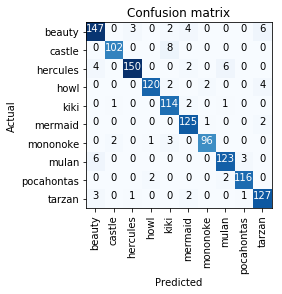

In [86]:
interp.plot_confusion_matrix()

[793, 806, 817, 824, 859, 940]


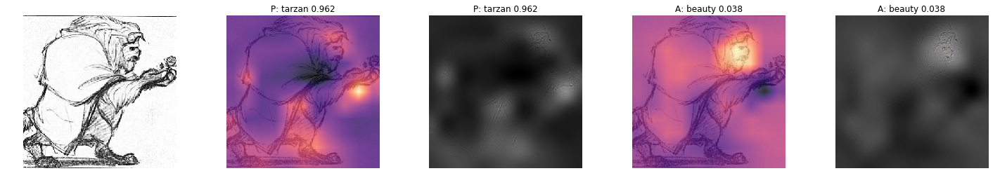

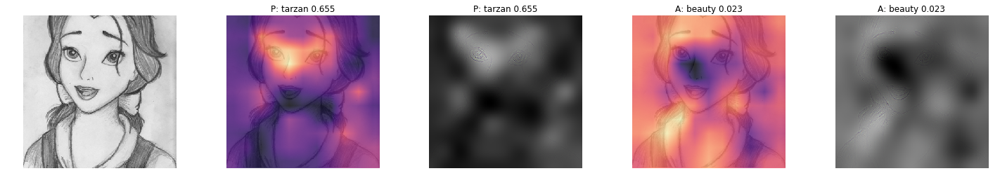

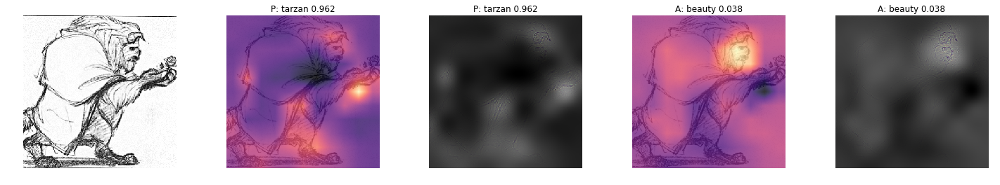

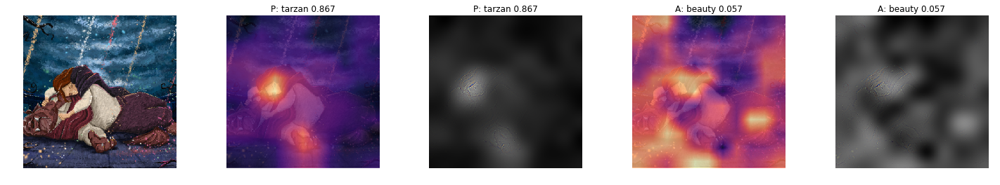

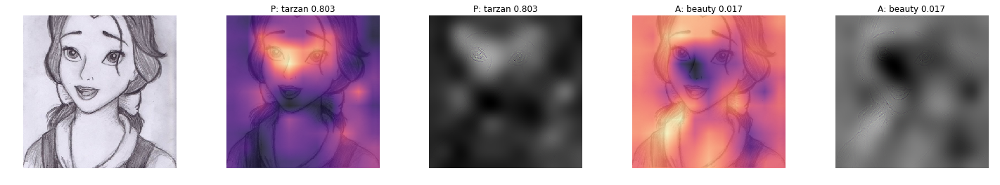

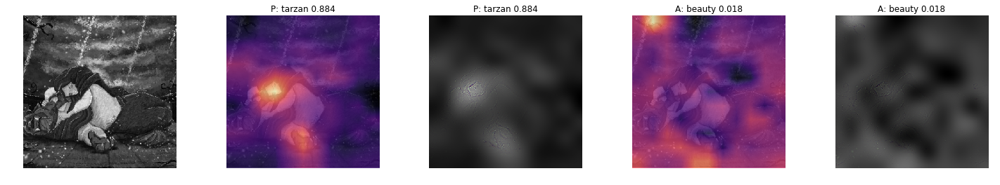

In [79]:
classes = data.classes
true_idx,pred_idx = class2idx('beauty'),class2idx('tarzan')
mismatch_idxs =[i for i,(tru,pred) in enumerate(zip(data.valid_ds.y.items,interp.pred_class.numpy())) if tru==true_idx and pred==pred_idx]
print(mismatch_idxs)

for idx in mismatch_idxs:
    gcam = GradCam.from_learner(learn,interp,idx,include_label=True)
    gcam.plot()

## After stage 2 of progressive size increase

In [80]:
tfms = get_transforms()
data=None
gc.collect()
data = get_data(60,350,tfms)
learn= reset_learner(data)
learn.load('stage2-350-new-2-4epochs-907306');

interp = ClassificationInterpretation.from_learner(learn)

interp.most_confused()

[('castle', 'kiki', 6),
 ('hercules', 'mulan', 5),
 ('beauty', 'mermaid', 4),
 ('beauty', 'tarzan', 4),
 ('hercules', 'beauty', 4),
 ('howl', 'kiki', 4),
 ('kiki', 'castle', 4),
 ('mulan', 'beauty', 4),
 ('mulan', 'pocahontas', 4),
 ('pocahontas', 'mulan', 4),
 ('tarzan', 'mermaid', 4),
 ('beauty', 'hercules', 3),
 ('tarzan', 'beauty', 3),
 ('castle', 'hercules', 2),
 ('hercules', 'mermaid', 2),
 ('howl', 'tarzan', 2),
 ('kiki', 'mononoke', 2),
 ('mononoke', 'howl', 2),
 ('tarzan', 'hercules', 2)]

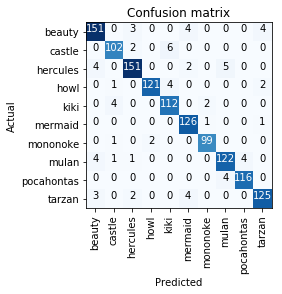

In [83]:
interp.plot_confusion_matrix()

[824, 871, 906, 940]


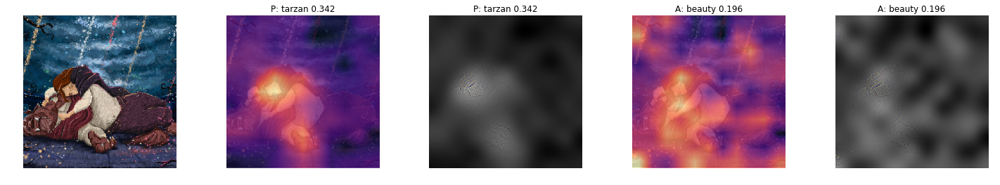

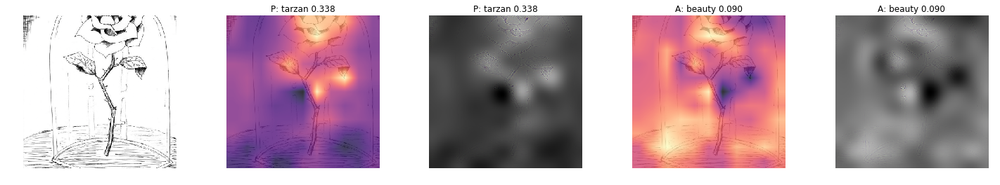

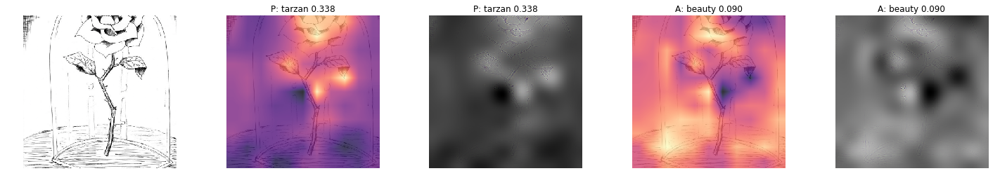

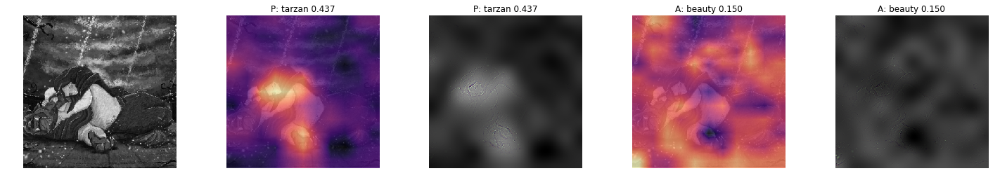

In [82]:
classes = data.classes
true_idx,pred_idx = class2idx('beauty'),class2idx('tarzan')
mismatch_idxs =[i for i,(tru,pred) in enumerate(zip(data.valid_ds.y.items,interp.pred_class.numpy())) if tru==true_idx and pred==pred_idx]
print(mismatch_idxs)

for idx in mismatch_idxs:
    gcam = GradCam.from_learner(learn,interp,idx,include_label=True)
    gcam.plot()

# Test set performance

In [16]:
data=None
gc.collect()

tfms = get_transforms()
data= ImageDataBunch.from_folder(PATH,train='train',valid='test',bs=60,
                                 ds_tfms = tfms,size=350,num_workers=4).normalize(imagenet_stats)

learn= reset_learner(data)

In [22]:
# 4	0.030303	0.209731	0.945216. No TTA: .768
# 3rd. Can be overfitted
learn.load('stage2-350-new-2-4epochs-907306');
interp = ClassificationInterpretation.from_learner(learn,tta=True)

accuracy(interp.probs,torch.tensor(data.valid_ds.y.items))

tensor(0.7600)

In [12]:
# 2	0.033454	0.209796	0.946759. No TTA: .7520
# NO
learn.load('stage2-350-new-2-2epochs-907306');
interp = ClassificationInterpretation.from_learner(learn,tta=True)

accuracy(interp.probs,torch.tensor(data.valid_ds.y.items))

tensor(0.7520)

In [21]:
# 2	0.048032	0.219395	0.943673. No TTA: .7520
# ABSOLUTELY NO
learn.load('stage2-350-new-2epochs-305');
interp = ClassificationInterpretation.from_learner(learn,tta=True)

accuracy(interp.probs,torch.tensor(data.valid_ds.y.items))

tensor(0.7440)

In [20]:
# 8	0.025183	0.251084	0.941358. No TTA: .7920
# 1st
learn.load('stage1-350-new-8epochs-303');
interp = ClassificationInterpretation.from_learner(learn,tta=True)

accuracy(interp.probs,torch.tensor(data.valid_ds.y.items))

tensor(0.7840)

In [24]:
# No TTA: .7920
# 1st-ish. Consistent on TTA
learn.load('stage1-350-new-5epochs-303');
interp = ClassificationInterpretation.from_learner(learn,tta=True)

accuracy(interp.probs,torch.tensor(data.valid_ds.y.items))

tensor(0.8000)

In [25]:
data=None
gc.collect()

tfms = get_transforms()
data= ImageDataBunch.from_folder(PATH,train='train',valid='test',bs=60,
                                 ds_tfms = tfms,size=300,num_workers=4).normalize(imagenet_stats)

learn= reset_learner(data)

In [29]:
learn.load('stage2-300-new-5epochs');
interp = ClassificationInterpretation.from_learner(learn,tta=True)

accuracy(interp.probs,torch.tensor(data.valid_ds.y.items))
# 5	0.034788	0.235029	0.936728. No TTA: .800
# 2nd

tensor(0.7600)

# Interpretation on test set

In [86]:
data=None
gc.collect()

tfms = get_transforms()
data= ImageDataBunch.from_folder(PATH,train='train',valid='test',bs=60,
                                 ds_tfms = tfms,size=350,num_workers=4).normalize(imagenet_stats)

learn= reset_learner(data)
learn.load('stage1-350-new-8epochs-303');

In [87]:
interp = ClassificationInterpretation.from_learner(learn)
interp.most_confused()

[('mermaid', 'hercules', 4),
 ('castle', 'beauty', 2),
 ('howl', 'castle', 2),
 ('tarzan', 'beauty', 2)]

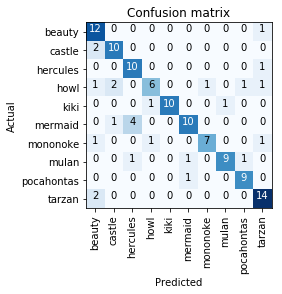

In [88]:
interp.plot_confusion_matrix()

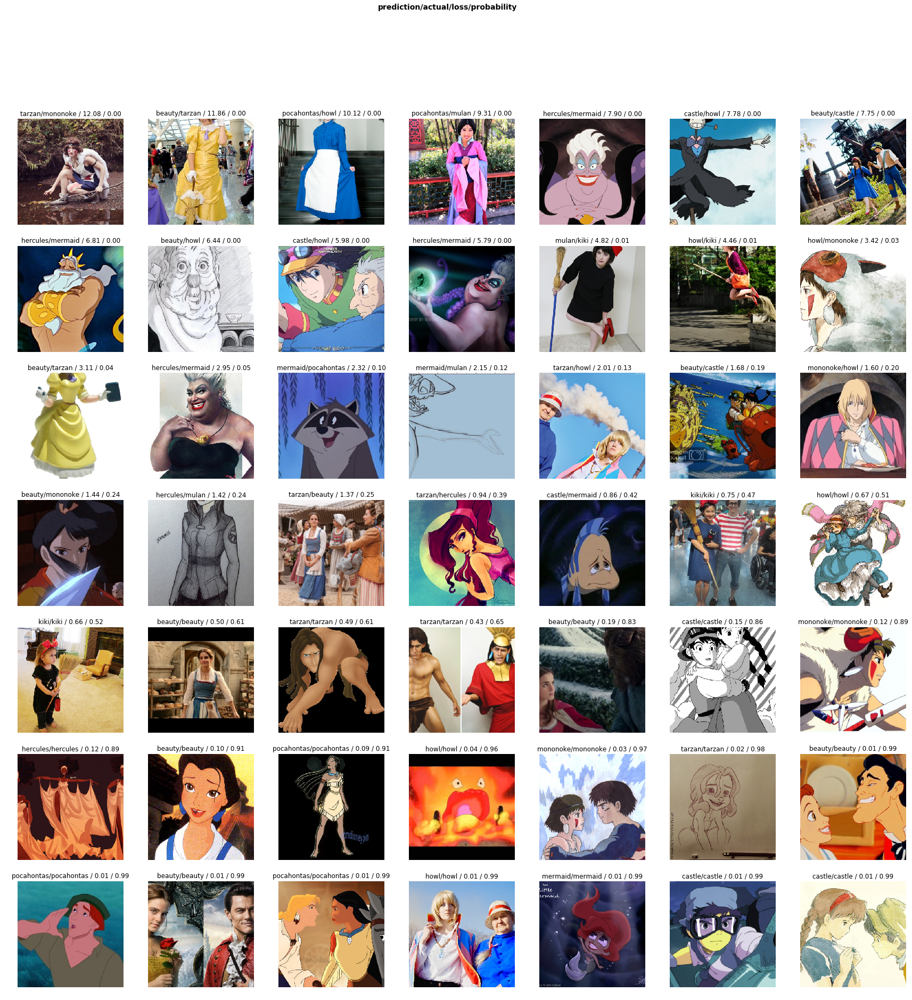

In [90]:
interp.plot_top_losses(49,figsize=(30,30))

[60, 69, 71, 73]


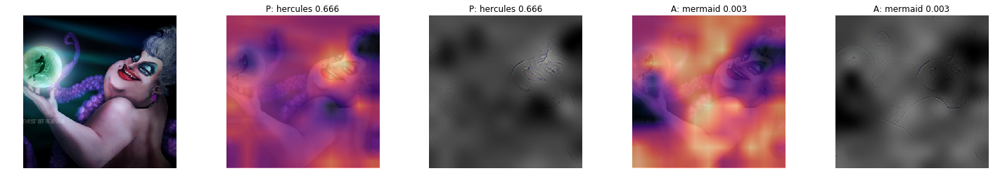

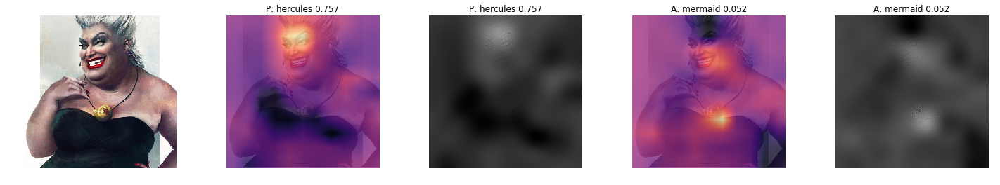

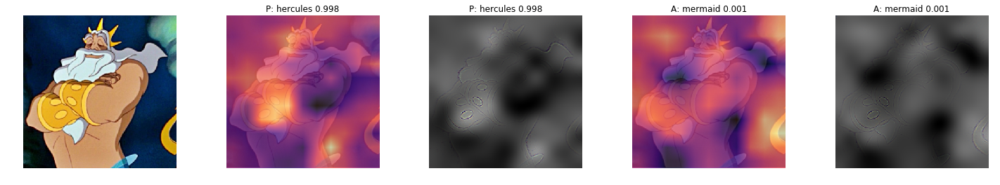

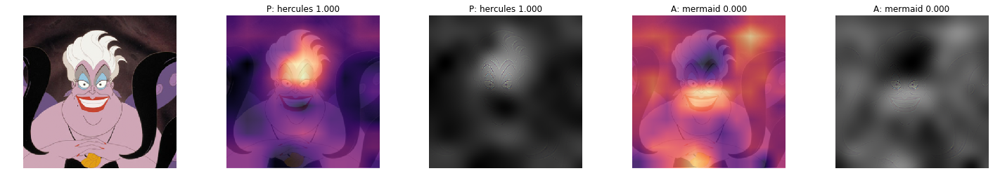

In [91]:
classes = data.classes
true_idx,pred_idx = class2idx('mermaid'),class2idx('hercules')
mismatch_idxs =[i for i,(tru,pred) in enumerate(zip(data.valid_ds.y.items,interp.pred_class.numpy())) if tru==true_idx and pred==pred_idx]
print(mismatch_idxs)

for idx in mismatch_idxs:
    gcam = GradCam.from_learner(learn,interp,idx,include_label=True)
    gcam.plot()

[46, 47]


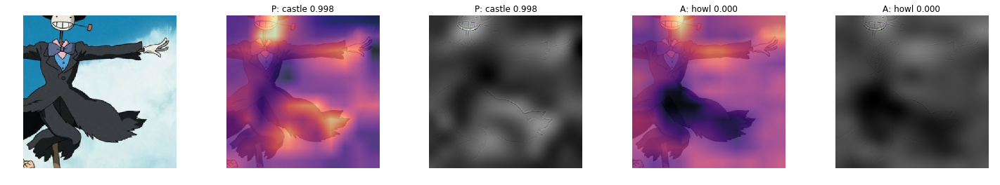

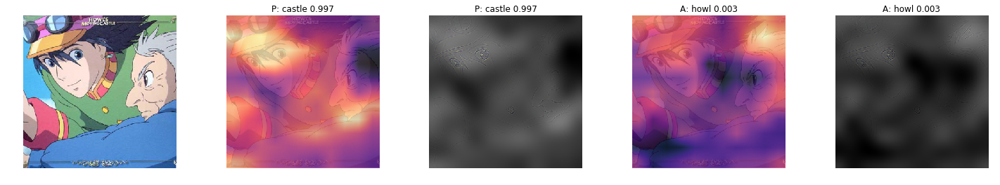

In [94]:
classes = data.classes
true_idx,pred_idx = class2idx('howl'),class2idx('castle')
mismatch_idxs =[i for i,(tru,pred) in enumerate(zip(data.valid_ds.y.items,interp.pred_class.numpy())) if tru==true_idx and pred==pred_idx]
print(mismatch_idxs)

for idx in mismatch_idxs:
    gcam = GradCam.from_learner(learn,interp,idx,include_label=True)
    gcam.plot()